Google Earth Engine to TIF Export - Burn Scar Analysis
Multi-temporal Satellite Imagery Processing for Prithvi EO 2.0

This script processes Sentinel-2 satellite imagery through Google Earth Engine to:
1. Calculate burn severity indices (dNBR)
2. Generate severity classifications
3. Export multi-band GeoTIFF files for model training
4. Create RGB visualizations for data understanding

Author: Tushar Thokdar


In [1]:
import ee
import geemap
import rasterio
import numpy as np
import pandas as pd
import math
from pathlib import Path

In [2]:
# ============================================================================
# CONFIGURATION
# ============================================================================

class Config:
    """Configuration for GEE processing and export"""

    # Google Earth Engine Project
    GEE_PROJECT_ID = 'your own gee id'  # UPDATE THIS

    # Area of Interest (AOI)
    # Example: Park Fire 2024 in California
    AOI_BOUNDS = [-121.90, 39.80, -121.50, 40.30]  # [west, south, east, north]

    # Temporal Windows
    PRE_FIRE_START = '2024-05-15'
    PRE_FIRE_END = '2024-06-30'
    POST_FIRE_START = '2024-09-15'
    POST_FIRE_END = '2024-10-30'

    # Processing Parameters
    CLOUD_THRESHOLD_PRE = 20   # Max cloud coverage % for pre-fire
    CLOUD_THRESHOLD_POST = 30  # Max cloud coverage % for post-fire
    EXPORT_SCALE = 20          # Meters per pixel (Sentinel-2 resolution)

    # Prithvi Bands (6 spectral bands)
    PRITHVI_BANDS = ['B2', 'B3', 'B4', 'B8A', 'B11', 'B12']
    # B2: Blue, B3: Green, B4: Red, B8A: NIR, B11: SWIR1, B12: SWIR2

    # Severity Thresholds (dNBR-based)
    SEVERITY_THRESHOLDS = {
        'regrowth': -0.1,
        'unburned': 0.1,
        'low': 0.27,
        'moderate_low': 0.44,
        'moderate_high': 0.66
    }

    # Export Settings
    EXPORT_FOLDER = 'Fire_Analysis_Output'
    EXPORT_DESCRIPTION_BASIC = 'Fire_Analysis_Basic'
    EXPORT_DESCRIPTION_PRITHVI = 'Prithvi_PrePost_Training_Data'
    MAX_PIXELS = 1e9


In [3]:
# ============================================================================
# EARTH ENGINE INITIALIZATION
# ============================================================================

def initialize_gee(project_id: str = None) -> None:
    """
    Initialize Google Earth Engine with authentication

    Args:
        project_id: GEE project ID
    """
    project_id = project_id or Config.GEE_PROJECT_ID

    try:
        ee.Initialize(project=project_id)
        print(f"✅ Google Earth Engine initialized successfully")
        print(f"   Project: {project_id}")
    except Exception as e:
        print("🔐 Authentication required...")
        ee.Authenticate()
        ee.Initialize(project=project_id)
        print(f"✅ Authenticated and initialized")


# ============================================================================
# IMAGE PROCESSING FUNCTIONS
# ============================================================================

def mask_s2_clouds(image: ee.Image) -> ee.Image:
    """
    Apply cloud masking to Sentinel-2 imagery using SCL band

    Args:
        image: Sentinel-2 image

    Returns:
        Cloud-masked image with reflectance scaled to [0, 1]
    """
    scl = image.select('SCL')

    # Keep: Vegetation(4), Bare Soil(5), Water(6)
    # Exclude: Clouds, Cloud Shadows, Snow, etc.
    mask = scl.eq(4).Or(scl.eq(5)).Or(scl.eq(6))

    # Scale reflectance from [0, 10000] to [0, 1]
    return image.updateMask(mask).divide(10000)


def get_clean_sentinel2(
    area: ee.Geometry,
    start_date: str,
    end_date: str,
    bands: list,
    cloud_threshold: float = 20
) -> ee.Image:
    """
    Get cloud-free Sentinel-2 composite for a time period

    Args:
        area: Area of interest geometry
        start_date: Start date (YYYY-MM-DD)
        end_date: End date (YYYY-MM-DD)
        bands: List of band names to select
        cloud_threshold: Maximum cloud coverage percentage

    Returns:
        Median composite image
    """
    collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                 .filterBounds(area)
                 .filterDate(start_date, end_date)
                 .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', cloud_threshold))
                 .map(mask_s2_clouds)
                 .median()
                 .clip(area))

    return collection.select(bands)


def calculate_dnbr(pre_image: ee.Image, post_image: ee.Image) -> ee.Image:
    """
    Calculate differenced Normalized Burn Ratio (dNBR)

    dNBR = NBR_pre - NBR_post
    NBR = (NIR - SWIR2) / (NIR + SWIR2)

    Args:
        pre_image: Pre-fire image
        post_image: Post-fire image

    Returns:
        dNBR image
    """
    # Calculate NBR for both images
    # Using B8A (NIR) and B12 (SWIR2)
    pre_nbr = pre_image.normalizedDifference(['B8A', 'B12']).rename('pre_nbr')
    post_nbr = post_image.normalizedDifference(['B8A', 'B12']).rename('post_nbr')

    # Calculate difference
    dnbr = pre_nbr.subtract(post_nbr).rename('dnbr')

    return dnbr


def classify_severity(dnbr: ee.Image, thresholds: dict = None) -> ee.Image:
    """
    Classify burn severity based on dNBR thresholds

    Classes:
        0: Regrowth (dNBR < -0.1)
        1: Unburned (-0.1 to 0.1)
        2: Low Severity (0.1 to 0.27)
        3: Moderate-Low (0.27 to 0.44)
        4: Moderate-High (0.44 to 0.66)
        5: High Severity (> 0.66)

    Args:
        dnbr: dNBR image
        thresholds: Optional custom thresholds

    Returns:
        Severity classification image
    """
    thresholds = thresholds or Config.SEVERITY_THRESHOLDS

    severity = (dnbr.gt(thresholds['regrowth'])
                .add(dnbr.gt(thresholds['unburned']))
                .add(dnbr.gt(thresholds['low']))
                .add(dnbr.gt(thresholds['moderate_low']))
                .add(dnbr.gt(thresholds['moderate_high']))
                .rename('severity'))

    return severity


In [4]:
# ============================================================================
# EXPORT FUNCTIONS
# ============================================================================

def export_basic_analysis(
    dnbr: ee.Image,
    severity: ee.Image,
    pre_rgb: ee.Image,
    post_rgb: ee.Image,
    area: ee.Geometry,
    config: Config = Config()
) -> ee.batch.Task:
    """
    Export basic 8-band analysis file

    Bands:
        1: dNBR (continuous)
        2: Severity class (0-5)
        3-5: Pre-fire RGB
        6-8: Post-fire RGB

    Args:
        dnbr: dNBR image
        severity: Severity classification
        pre_rgb: Pre-fire RGB composite
        post_rgb: Post-fire RGB composite
        area: Export area
        config: Configuration object

    Returns:
        Export task
    """
    # Stack all bands
    stack = (dnbr
            .addBands(severity.float())
            .addBands(pre_rgb.select(['B4', 'B3', 'B2']))  # RGB
            .addBands(post_rgb.select(['B4', 'B3', 'B2']))
            .float())

    # Create export task
    task = ee.batch.Export.image.toDrive(
        image=stack,
        description=config.EXPORT_DESCRIPTION_BASIC,
        folder=config.EXPORT_FOLDER,
        scale=config.EXPORT_SCALE,
        region=area,
        maxPixels=config.MAX_PIXELS
    )

    return task


def export_prithvi_format(
    pre_image: ee.Image,
    post_image: ee.Image,
    severity: ee.Image,
    area: ee.Geometry,
    config: Config = Config()
) -> ee.batch.Task:
    """
    Export 13-band file for Prithvi EO 2.0 training

    Bands:
        0-5: Pre-fire (B2, B3, B4, B8A, B11, B12)
        6-11: Post-fire (B2, B3, B4, B8A, B11, B12)
        12: Severity label (0-5)

    Args:
        pre_image: Pre-fire image with all bands
        post_image: Post-fire image with all bands
        severity: Severity classification
        area: Export area
        config: Configuration object

    Returns:
        Export task
    """
    # Rename bands for clarity
    pre_renamed = pre_image.rename([
        'pre_B2', 'pre_B3', 'pre_B4', 'pre_B8A', 'pre_B11', 'pre_B12'
    ])

    post_renamed = post_image.rename([
        'post_B2', 'post_B3', 'post_B4', 'post_B8A', 'post_B11', 'post_B12'
    ])

    # Stack: Pre (6) + Post (6) + Label (1) = 13 bands
    final_stack = (pre_renamed
                  .addBands(post_renamed)
                  .addBands(severity.rename('label'))
                  .float())

    # Create export task
    task = ee.batch.Export.image.toDrive(
        image=final_stack,
        description=config.EXPORT_DESCRIPTION_PRITHVI,
        folder=config.EXPORT_FOLDER,
        scale=config.EXPORT_SCALE,
        region=area,
        maxPixels=config.MAX_PIXELS
    )

    return task


In [5]:
# ============================================================================
# VISUALIZATION
# ============================================================================

def create_interactive_map(
    pre_image: ee.Image,
    post_image: ee.Image,
    dnbr: ee.Image,
    severity: ee.Image,
    area: ee.Geometry
) -> geemap.Map:
    """
    Create interactive map with all layers

    Args:
        pre_image: Pre-fire image
        post_image: Post-fire image
        dnbr: dNBR image
        severity: Severity classification
        area: Area of interest

    Returns:
        Interactive map object
    """
    # Initialize map
    m = geemap.Map()
    m.centerObject(area, 10)

    # Visualization parameters
    vis_rgb = {
        'bands': ['B4', 'B3', 'B2'],
        'min': 0,
        'max': 0.3
    }

    dnbr_vis = {
        'min': -0.2,
        'max': 0.8,
        'palette': [
            '#7fb3d5',  # Blue: Regrowth
            '#ffffff',  # White: Unburned
            '#f4d03f',  # Yellow: Low
            '#e67e22',  # Orange: Moderate
            '#c0392b',  # Red: High
            '#641e16'   # Dark Red: Severe
        ]
    }

    severity_vis = {
        'min': 0,
        'max': 5,
        'palette': [
            '#006400',  # Dark Green: Regrowth
            '#7fffd4',  # Aquamarine: Unburned
            '#ffff00',  # Yellow: Low
            '#ffa500',  # Orange: Moderate-Low
            '#ff0000',  # Red: Moderate-High
            '#8b0000'   # Dark Red: High
        ]
    }

    # Add layers
    m.addLayer(pre_image, vis_rgb, 'Pre-Fire RGB', False)
    m.addLayer(post_image, vis_rgb, 'Post-Fire RGB', False)
    m.addLayer(dnbr, dnbr_vis, 'dNBR Index', True)
    m.addLayer(severity, severity_vis, 'Severity Classes', True)
    m.addLayer(area, {'color': 'red'}, 'Analysis Area', False)

    return m

In [6]:
# ============================================================================
# MAIN WORKFLOW
# ============================================================================

def run_fire_analysis(config: Config = Config()) -> dict:
    """
    Complete workflow for fire analysis and export

    Args:
        config: Configuration object

    Returns:
        Dictionary containing tasks and metadata
    """
    print("=" * 70)
    print("🔥 BURN SCAR ANALYSIS - GEE PROCESSING")
    print("=" * 70)

    # Initialize GEE
    initialize_gee(config.GEE_PROJECT_ID)

    # Define area of interest
    analysis_area = ee.Geometry.Rectangle(config.AOI_BOUNDS)

    print(f"\n📍 Analysis Area: {config.AOI_BOUNDS}")
    print(f"📅 Pre-Fire Period: {config.PRE_FIRE_START} to {config.PRE_FIRE_END}")
    print(f"📅 Post-Fire Period: {config.POST_FIRE_START} to {config.POST_FIRE_END}")
    print()

    # Get imagery
    print("🛰️  Loading Pre-Fire Imagery...")
    pre_image = get_clean_sentinel2(
        analysis_area,
        config.PRE_FIRE_START,
        config.PRE_FIRE_END,
        config.PRITHVI_BANDS,
        config.CLOUD_THRESHOLD_PRE
    )

    print("🛰️  Loading Post-Fire Imagery...")
    post_image = get_clean_sentinel2(
        analysis_area,
        config.POST_FIRE_START,
        config.POST_FIRE_END,
        config.PRITHVI_BANDS,
        config.CLOUD_THRESHOLD_POST
    )

    # Calculate indices
    print("🔬 Calculating dNBR...")
    dnbr = calculate_dnbr(pre_image, post_image)

    print("🗺️  Classifying Severity...")
    severity = classify_severity(dnbr)

    # Create visualization
    print("🎨 Creating Interactive Map...")
    map_obj = create_interactive_map(
        pre_image, post_image, dnbr, severity, analysis_area
    )

    # Export tasks
    print("\n📤 Starting Export Tasks...")

    # Basic analysis export
    print("   → Basic Analysis (8 bands: dNBR + Severity + RGB)")
    task_basic = export_basic_analysis(
        dnbr, severity, pre_image, post_image, analysis_area, config
    )
    task_basic.start()

    # Prithvi format export
    print("   → Prithvi Format (13 bands: 6 Pre + 6 Post + Label)")
    task_prithvi = export_prithvi_format(
        pre_image, post_image, severity, analysis_area, config
    )
    task_prithvi.start()

    print("\n✅ Export tasks started successfully!")
    print(f"📂 Check Google Drive folder: '{config.EXPORT_FOLDER}'")
    print("⏱️  Processing time: ~10-15 minutes")

    return {
        'map': map_obj,
        'tasks': {
            'basic': task_basic,
            'prithvi': task_prithvi
        },
        'config': config
    }

In [15]:
# ============================================================================
# POST-PROCESSING: TIF ANALYSIS
# ============================================================================

class TIFAnalyzer:
    """Analyze exported TIF files for metrics and statistics"""

    CLASS_NAMES = {
        0: 'Regrowth',
        1: 'Unburned',
        2: 'Low Severity',
        3: 'Moderate-Low Severity',
        4: 'Moderate-High Severity',
        5: 'High Severity'
    }

    def __init__(self, tif_path: str):
        """
        Initialize analyzer with TIF file

        Args:
            tif_path: Path to GeoTIFF file
        """
        self.tif_path = Path(tif_path)
        self.src = None
        self.dnbr = None
        self.severity = None
        self.pixel_area_sqm = None

    def load_data(self):
        """Load TIF data and calculate pixel area"""
        with rasterio.open(self.tif_path) as src:
            self.src = src

            # Load bands (for basic 8-band file)
            self.dnbr = src.read(1)
            self.severity = src.read(2)

            # Calculate pixel area
            self.pixel_area_sqm = self._calculate_pixel_area(src)

    def _calculate_pixel_area(self, src) -> float:
        """Calculate pixel area in square meters"""
        res_x = src.transform[0]
        res_y = -src.transform[4]

        # Check if coordinates are in degrees or meters
        if res_x < 1.0:
            # Degrees - convert to meters
            bounds = src.bounds
            center_lat = (bounds.bottom + bounds.top) / 2

            meters_per_deg_lat = 111320
            meters_per_deg_lon = 111320 * math.cos(math.radians(center_lat))

            pixel_area = (res_x * meters_per_deg_lon) * (res_y * meters_per_deg_lat)
        else:
            # Already in meters
            pixel_area = res_x * res_y

        return pixel_area

    def calculate_statistics(self) -> pd.DataFrame:
        """
        Calculate burn scar statistics

        Returns:
            DataFrame with statistics per class
        """
        if self.severity is None:
            self.load_data()

        # Filter out NaN values from severity array
        valid_severity = self.severity[~np.isnan(self.severity)]

        # Count pixels per class
        unique, counts = np.unique(valid_severity, return_counts=True)

        stats = []
        total_pixels = valid_severity.size # Use size of valid pixels for percentage calculation

        for class_id, count in zip(unique, counts):
            area_sqm = count * self.pixel_area_sqm
            area_acres = area_sqm / 4046.86  # Convert to acres
            area_hectares = area_sqm / 10000  # Convert to hectares
            percentage = (count / total_pixels) * 100

            stats.append({
                'Class': self.CLASS_NAMES.get(int(class_id), f'Class {int(class_id)}'),
                'Class_ID': int(class_id),
                'Pixel_Count': count,
                'Area_sqm': area_sqm,
                'Area_acres': area_acres,
                'Area_hectares': area_hectares,
                'Percentage': percentage
            })

        df = pd.DataFrame(stats)
        return df

    def print_summary(self):
        """Print formatted summary statistics"""
        stats = self.calculate_statistics()

        print("\n" + "=" * 70)
        print("📊 BURN SCAR ANALYSIS SUMMARY")
        print("=" * 70)

        print(f"\n🗺️  Total Area Analyzed:")
        total_area = stats['Area_acres'].sum()
        print(f"   {total_area:,.0f} acres ({stats['Area_hectares'].sum():,.0f} hectares)")

        print(f"\n🔥 Severity Distribution:")
        print(f"{'Class':<25} {'Acres':<15} {'Hectares':<15} {'%':<10}")
        print("-" * 70)

        for _, row in stats.iterrows():
            print(f"{row['Class']:<25} {row['Area_acres']:>12,.0f}   "
                  f"{row['Area_hectares']:>12,.0f}   {row['Percentage']:>6.2f}%")

        print("-" * 70)

        # dNBR statistics
        if self.dnbr is not None:
            valid_dnbr = self.dnbr[np.isfinite(self.dnbr)]
            print(f"\n📈 dNBR Statistics:")
            print(f"   Mean:   {np.mean(valid_dnbr):.4f}")
            print(f"   Median: {np.median(valid_dnbr):.4f}")
            print(f"   Std:    {np.std(valid_dnbr):.4f}")
            print(f"   Min:    {np.min(valid_dnbr):.4f}")
            print(f"   Max:    {np.max(valid_dnbr):.4f}")

In [8]:
# ============================================================================
# RGB VISUALIZATION UTILITIES
# ============================================================================

def create_rgb_chips(
    tif_path: str,
    output_dir: str = "rgb_chips",
    chip_size: int = 512,
    max_chips: int = 10
):
    """
    Create RGB visualization chips for data understanding

    Args:
        tif_path: Path to GeoTIFF file
        output_dir: Output directory for RGB chips
        chip_size: Size of chips to extract
        max_chips: Maximum number of chips to create
    """
    import matplotlib.pyplot as plt
    from matplotlib.colors import ListedColormap

    output_path = Path(output_dir)
    output_path.mkdir(exist_ok=True)

    print(f"\n🎨 Creating RGB Visualization Chips...")
    print(f"   Output: {output_dir}/")

    # Severity colormap
    severity_colors = [
        '#006400',  # Regrowth
        '#7fffd4',  # Unburned
        '#ffff00',  # Low
        '#ffa500',  # Moderate-Low
        '#ff0000',  # Moderate-High
        '#8b0000'   # High
    ]
    severity_cmap = ListedColormap(severity_colors)

    with rasterio.open(tif_path) as src:
        # Assuming 8-band file: [dNBR, Severity, Pre-RGB, Post-RGB]
        height, width = src.height, src.width

        chips_created = 0

        # Sample different regions
        step = max(chip_size, (height - chip_size) // int(np.sqrt(max_chips)))

        for r in range(0, height - chip_size, step):
            for c in range(0, width - chip_size, step):
                if chips_created >= max_chips:
                    break

                # Read window
                window = rasterio.windows.Window(c, r, chip_size, chip_size)

                dnbr = src.read(1, window=window)
                severity = src.read(2, window=window)
                pre_rgb = src.read([3, 4, 5], window=window)  # R, G, B
                post_rgb = src.read([6, 7, 8], window=window)

                # Create 2x2 subplot
                fig, axes = plt.subplots(2, 2, figsize=(12, 12))

                # Pre-fire RGB
                axes[0, 0].imshow(np.transpose(pre_rgb, (1, 2, 0)) * 3)
                axes[0, 0].set_title('Pre-Fire RGB', fontsize=14, fontweight='bold')
                axes[0, 0].axis('off')

                # Post-fire RGB
                axes[0, 1].imshow(np.transpose(post_rgb, (1, 2, 0)) * 3)
                axes[0, 1].set_title('Post-Fire RGB', fontsize=14, fontweight='bold')
                axes[0, 1].axis('off')

                # dNBR
                im1 = axes[1, 0].imshow(dnbr, cmap='RdYlGn_r', vmin=-0.2, vmax=0.8)
                axes[1, 0].set_title('dNBR Index', fontsize=14, fontweight='bold')
                axes[1, 0].axis('off')
                plt.colorbar(im1, ax=axes[1, 0], fraction=0.046)

                # Severity
                im2 = axes[1, 1].imshow(severity, cmap=severity_cmap, vmin=0, vmax=5)
                axes[1, 1].set_title('Severity Classification', fontsize=14, fontweight='bold')
                axes[1, 1].axis('off')
                cbar = plt.colorbar(im2, ax=axes[1, 1], fraction=0.046, ticks=[0,1,2,3,4,5])
                cbar.ax.set_yticklabels(['Regrowth', 'Unburned', 'Low', 'Mod-Low', 'Mod-High', 'High'])

                plt.tight_layout()
                plt.savefig(output_path / f'chip_{chips_created:03d}.png', dpi=150, bbox_inches='tight')
                plt.close()

                chips_created += 1

            if chips_created >= max_chips:
                break

    print(f"   ✅ Created {chips_created} RGB visualization chips")


In [9]:
# ============================================================================
# USAGE EXAMPLE
# ============================================================================

if __name__ == "__main__":
    """
    Example workflow for processing fire imagery
    """

    # Configure your analysis
    config = Config()
    config.GEE_PROJECT_ID = 'your own gee id'  # UPDATE THIS!
    config.AOI_BOUNDS = [-121.90, 39.80, -121.50, 40.30]  # Park Fire example
    config.PRE_FIRE_START = '2024-05-15'
    config.PRE_FIRE_END = '2024-06-30'
    config.POST_FIRE_START = '2024-09-15'
    config.POST_FIRE_END = '2024-10-30'

    # Run analysis and export
    results = run_fire_analysis(config)

    # Display interactive map (in Jupyter/Colab)
    # results['map']

    # After export completes (10-15 minutes), analyze the TIF
    # Uncomment and run after download:

    # tif_path = '/path/to/downloaded/Fire_Analysis_Basic.tif'
    # analyzer = TIFAnalyzer(tif_path)
    # analyzer.print_summary()

    # Create RGB visualization chips
    # create_rgb_chips(tif_path, output_dir='rgb_visualizations', max_chips=10)

    print("\n" + "=" * 70)
    print("📝 NEXT STEPS:")
    print("=" * 70)
    print("1. Wait for GEE export to complete (~10-15 minutes)")
    print("2. Download files from Google Drive")
    print("3. Run TIFAnalyzer to get statistics")
    print("4. Create RGB chips for visualization")
    print("5. Use Prithvi format file for model training")
    print("=" * 70)

🔥 BURN SCAR ANALYSIS - GEE PROCESSING
🔐 Authentication required...
✅ Authenticated and initialized

📍 Analysis Area: [-121.9, 39.8, -121.5, 40.3]
📅 Pre-Fire Period: 2024-05-15 to 2024-06-30
📅 Post-Fire Period: 2024-09-15 to 2024-10-30

🛰️  Loading Pre-Fire Imagery...
🛰️  Loading Post-Fire Imagery...
🔬 Calculating dNBR...
🗺️  Classifying Severity...
🎨 Creating Interactive Map...

📤 Starting Export Tasks...
   → Basic Analysis (8 bands: dNBR + Severity + RGB)
   → Prithvi Format (13 bands: 6 Pre + 6 Post + Label)

✅ Export tasks started successfully!
📂 Check Google Drive folder: 'Fire_Analysis_Output'
⏱️  Processing time: ~10-15 minutes

📝 NEXT STEPS:
1. Wait for GEE export to complete (~10-15 minutes)
2. Download files from Google Drive
3. Run TIFAnalyzer to get statistics
4. Create RGB chips for visualization
5. Use Prithvi format file for model training


In [10]:
# Display the interactive map
results['map']

Map(center=[40.04986628118012, -121.6999999999998], controls=(WidgetControl(options=['position', 'transparent_…

In [11]:
# If in Colab, files are already accessible at:
basic_tif = '/content/drive/MyDrive/Fire_Analysis_Output/Fire_Analysis_Basic.tif'
prithvi_tif = '/content/drive/MyDrive/Fire_Analysis_Output/Prithvi_PrePost_Training_Data.tif'

In [16]:
# Analyze the basic TIF
analyzer = TIFAnalyzer('/content/drive/MyDrive/Fire_Analysis_Output (1)/Fire_Analysis_Basic.tif')
analyzer.print_summary()


📊 BURN SCAR ANALYSIS SUMMARY

🗺️  Total Area Analyzed:
   468,147 acres (189,452 hectares)

🔥 Severity Distribution:
Class                     Acres           Hectares        %         
----------------------------------------------------------------------
Regrowth                        44,800         18,130     9.57%
Unburned                       136,683         55,313    29.20%
Low Severity                    63,293         25,614    13.52%
Moderate-Low Severity           71,414         28,900    15.25%
Moderate-High Severity          62,438         25,268    13.34%
High Severity                   89,520         36,227    19.12%
----------------------------------------------------------------------

📈 dNBR Statistics:
   Mean:   0.2920
   Median: 0.2481
   Std:    0.3462
   Min:    -1.7278
   Max:    1.3792



🎨 Creating RGB Visualization Chips...
   Output: rgb_visualizations/


   ✅ Created 10 RGB visualization chips
📸 RGB Visualization Samples:


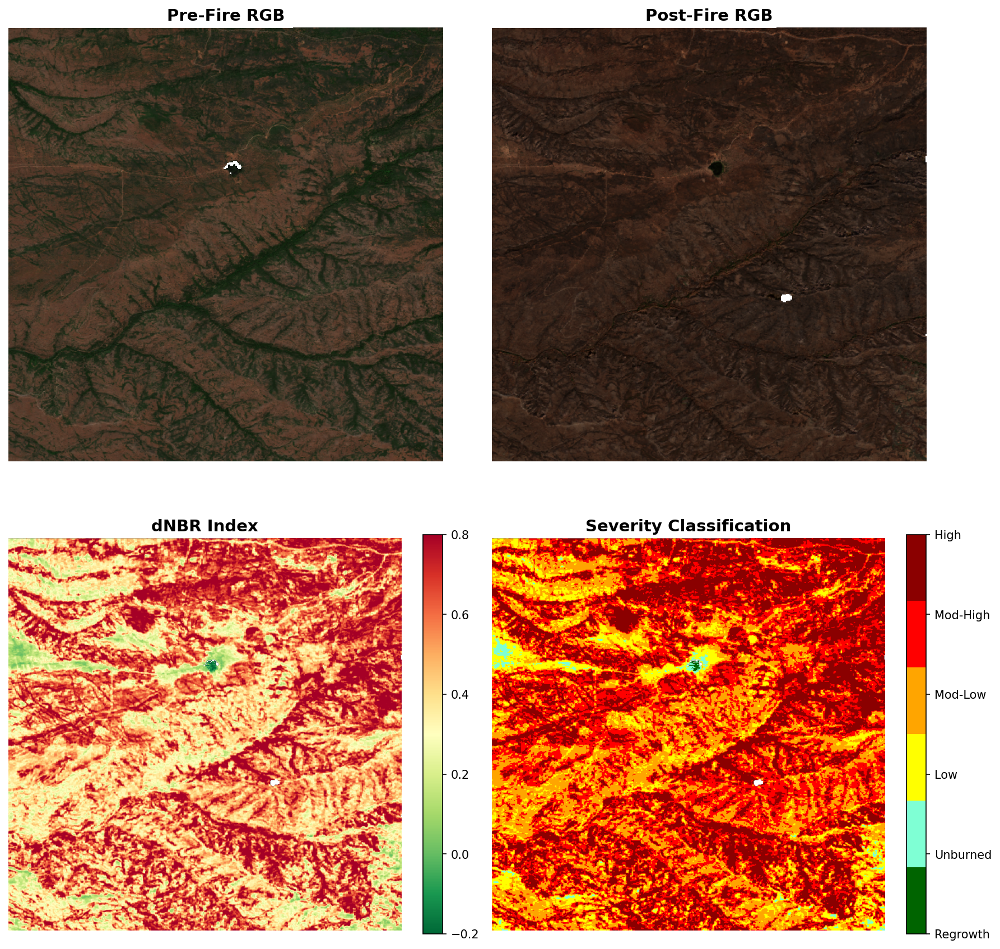

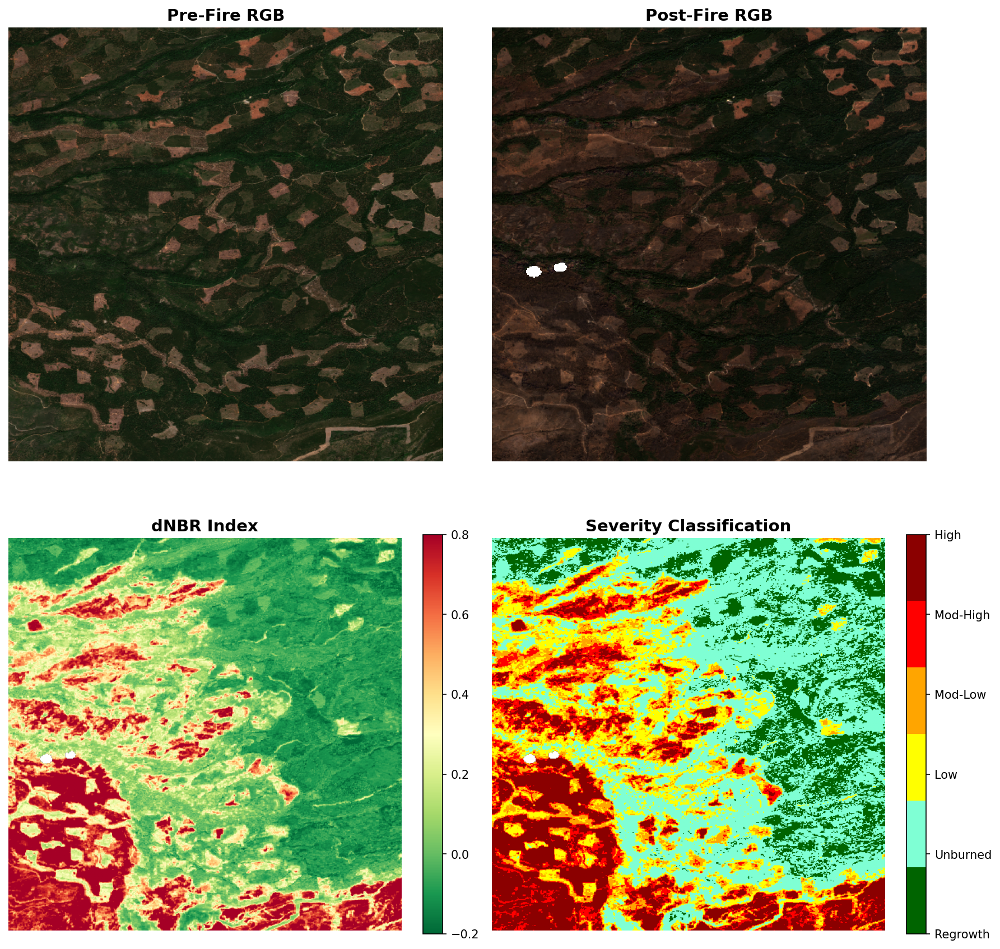

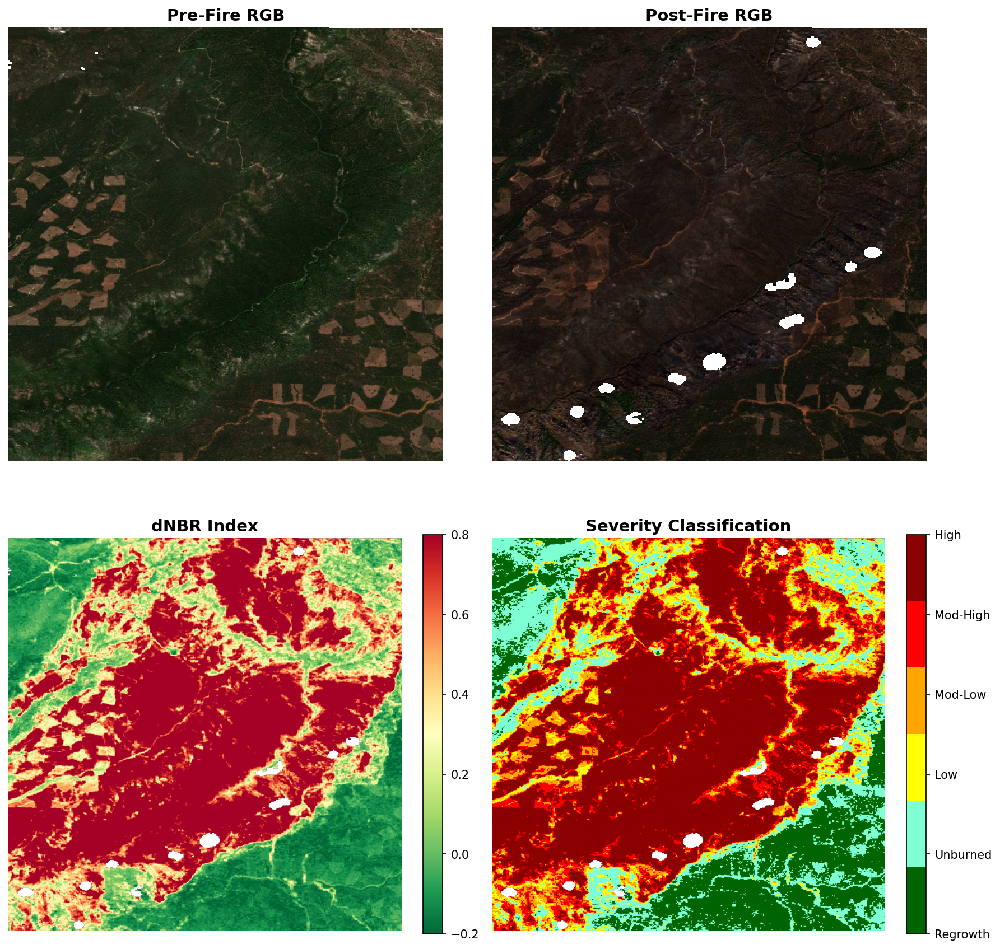

In [17]:
# Generate 10 sample visualizations
create_rgb_chips(
    tif_path='/content/drive/MyDrive/Fire_Analysis_Output (1)/Fire_Analysis_Basic.tif',
    output_dir='rgb_visualizations',
    chip_size=512,
    max_chips=10
)

# View them
from IPython.display import Image, display
import glob

print("📸 RGB Visualization Samples:")
for img_path in sorted(glob.glob('rgb_visualizations/*.png'))[:3]:
    display(Image(img_path, width=800))

Dear user,

Please find the link below to access the TIFF data, should it be required for reference or further analysis if you dont wanna run the gee:

[https://drive.google.com/drive/folders/1AGCiRrvapPbULkuJ92pRWwaowskwDPZo?usp=sharing](https://drive.google.com/drive/folders/1AGCiRrvapPbULkuJ92pRWwaowskwDPZo?usp=sharing)

Kindly let me know if you need any additional information or assistance.

Best regards,
Tushar Thokdar
